# Project (консультация)

## 1. Загрузка данных. Проверка корректности типов данных

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


In [56]:
df = pd.read_csv('Датасет GB.csv') # df = pd.read_csv('Датасет GB.csv', parse_dates = ['hit_date'])

In [57]:
df.head()

,session_id,claim,60sec,scroll_90,hit_date,referer_url,url,utm_source,utm_medium,gender,age,touch_screen,has_vk_id,has_ok_id
0,4358a11f0d16be6e,0,0,1,2021-12-01,https://gb.ru/education,https://gb.ru/comms/calendar,NaN,NaN,0,39,1,1,0
1,133509b7ff9a586c,0,0,0,2021-12-01,https://www.google.com/,https://gb.ru/courses/programming,google,cpc,-1,-1,2,0,0
2,8b23cd36f2b08dcd,0,0,0,2021-12-01,https://gb.ru/tests/352/trials/2238911/run,https://gb.ru/tests/352/trials/2238911,NaN,NaN,1,49,1,1,1
3,50de4c060fd128f3,0,1,1,2021-12-01,https://gb.ru/courses/1165,https://gb.ru/a/a1,NaN,NaN,-1,-1,1,1,0
4,c2ca3cc9a67c749b,0,0,0,2021-12-01,NaN,https://gb.ru/login,NaN,NaN,0,23,2,1,0


### Описание полей

**session_id** - идентификатор сессии

**claim** - признак наличия отправки формы заявки во вемя текущей сессии (0 – нет заявки, 1 – заявка отправлена)

**60sec** - признак длительности сессии 60 секунд и более (0 – сессия менее 60 сек, 1 – сессия 60 сек и более)

**scroll_90** - признак вертикальной прокрутки страницы глубиной 90% (0 – прокрутка менее 90%, 1 – прокрутка 90% и более)

**hit_date** - дата сессии

**referer_url** - адрес реферера страницы просмотра

**url** - адрес страницы просмотра

**utm_source** - utm-метка источника

**utm_medium** - utm-метка канала

**gender**- пол посетителя из куки (-1 – не определен, 0 – мужской, 1 – женский)

**age**- возраст посетителя из куки (-1 – не определен)

**touch_screen** - touch экран (0 – не определен, 1 – нет, 2 – есть)

**has_vk_id** - наличие идентификатора профиля пользователя Вконтакте (0 – нет, 1 – есть)

**has_ok_id** - наличие идентификатора профиля пользователя Одноклассников (0 – нет, 1 – есть)

Про utm-метки детально написано в статье: https://www.retailcrm.ru/blog/utm#:~:text=UTM%2D%D0%BC%D0%B5%D1%82%D0%BA%D0%B8%20%E2%80%94%20%D1%8D%D1%82%D0%BE%20%D1%82%D0%B5%D0%B3%D0%B8%2C,%D0%BA%D0%BB%D0%B8%D0%BA%D0%B0%D1%8E%D1%82%20%D0%BF%D0%BE%D0%BB%D1%8C%D0%B7%D0%BE%D0%B2%D0%B0%D1%82%D0%B5%D0%BB%D0%B8%20%D0%B8%20%D1%82%D0%B0%D0%BA%20%D0%B4%D0%B0%D0%BB%D0%B5%D0%B5.

In [58]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 884407 entries, 0 to 884406
Data columns (total 14 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   session_id    884407 non-null  object
 1   claim         884407 non-null  int64 
 2   60sec         884407 non-null  int64 
 3   scroll_90     884407 non-null  int64 
 4   hit_date      884407 non-null  object
 5   referer_url   687598 non-null  object
 6   url           884407 non-null  object
 7   utm_source    245184 non-null  object
 8   utm_medium    244863 non-null  object
 9   gender        884407 non-null  int64 
 10  age           884407 non-null  int64 
 11  touch_screen  884407 non-null  int64 
 12  has_vk_id     884407 non-null  int64 
 13  has_ok_id     884407 non-null  int64 
dtypes: int64(8), object(6)
memory usage: 94.5+ MB


In [59]:
df.dtypes

session_id      object
claim            int64
60sec            int64
scroll_90        int64
hit_date        object
referer_url     object
url             object
utm_source      object
utm_medium      object
gender           int64
age              int64
touch_screen     int64
has_vk_id        int64
has_ok_id        int64
dtype: object

Проведём оптимизацию типов данных - для столбцов 'referer_url' и 'url' приведём к строковому типу, бинарные признаки ('claim', 'has_ok_id', '60sec', 'scroll_90', 'has_vk_id' и 'has_ok_id') к логическому типу.

In [61]:
df['referer_url'] = df['referer_url'].astype('str')
df['url'] = df['url'].astype('str')
df['claim'] = df['claim'].astype('str')
df['has_ok_id'] = df['has_ok_id'].astype('bool')
df['60sec'] = df['60sec'].astype('bool')
df['scroll_90'] = df['scroll_90'].astype('bool')
df['has_vk_id'] = df['has_vk_id'].astype('bool')
df['has_ok_id'] = df['has_ok_id'].astype('bool')
df['hit_date'] = pd.to_datetime(df['hit_date']) # ещё один вариант преведение даты к типу datetime

Подробнее про datetime: https://pandas.pydata.org/docs/reference/api/pandas.to_datetime.html, https://docs.python.org/3/library/datetime.html

Проверим, что тип данных корректно изменён. После оптимизации типов данных размер занимаемой оперативной памяти уменьшился примерно на 20 Mb (25 %).

In [63]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 884407 entries, 0 to 884406
Data columns (total 14 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   session_id    884407 non-null  object        
 1   claim         884407 non-null  object        
 2   60sec         884407 non-null  bool          
 3   scroll_90     884407 non-null  bool          
 4   hit_date      884407 non-null  datetime64[ns]
 5   referer_url   884407 non-null  object        
 6   url           884407 non-null  object        
 7   utm_source    245184 non-null  object        
 8   utm_medium    244863 non-null  object        
 9   gender        884407 non-null  int64         
 10  age           884407 non-null  int64         
 11  touch_screen  884407 non-null  int64         
 12  has_vk_id     884407 non-null  bool          
 13  has_ok_id     884407 non-null  bool          
dtypes: bool(4), datetime64[ns](1), int64(3), object(6)
memory usage: 70.

In [70]:
sum(df['session_id'].duplicated())

20315

## 2. Исследовательский анализ данных

In [9]:
df['age'].value_counts()

-1     505397
 23     15155
 21     15119
 27     13601
 31     13571
        ...  
 2         20
 6         14
 3         10
 4          9
 5          3
Name: age, Length: 121, dtype: int64

Определим число различных url страниц. Видно, что требуется категоризация этого поля.

In [10]:
len(df['referer_url'].value_counts())

42581

In [11]:
df['referer_url'].value_counts()

nan                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     

In [12]:
df[df['referer_url'] == 'nan'].head()

,session_id,claim,60sec,scroll_90,hit_date,referer_url,url,utm_source,utm_medium,gender,age,touch_screen,has_vk_id,has_ok_id
4,c2ca3cc9a67c749b,0,False,False,2021-12-01,nan,https://gb.ru/login,NaN,NaN,0,23,2,True,False
6,d78d41d8657ce6e9,0,True,True,2021-12-01,nan,https://gb.ru/events/career-faq/long,sms,sms,-1,-1,2,True,False
21,5c94acc6d61483d2,0,False,False,2021-12-01,nan,https://gb.ru/s/edufree/besplatno,mt,cpc,-1,-1,2,False,False
26,ca2e695f749eecc8,0,False,False,2021-12-01,nan,https://gb.ru/,NaN,NaN,-1,-1,1,False,False
29,9639e70f54afef12,0,False,False,2021-12-01,nan,https://project2850680.tilda.ws/,NaN,NaN,-1,-1,1,False,False


In [13]:
df['referer_url'].replace('nan', np.NaN, inplace = True)

In [14]:
df[df['referer_url'] == 'nan']

,session_id,claim,60sec,scroll_90,hit_date,referer_url,url,utm_source,utm_medium,gender,age,touch_screen,has_vk_id,has_ok_id


In [15]:
df['url'].value_counts().head(10)

https://gb.ru/education                 150196
https://gb.ru/                          126766
https://gb.ru/s/edufree/besplatno       108939
https://gb.ru/login                      56082
https://gb.ru/courses                    17106
https://gb.ru/comms/chat                 16217
https://gb.ru/courses/programming        16008
https://gb.ru/events/career-faq/long     15964
https://gb.ru/profportal                 15045
https://gb.ru/courses/all                14974
Name: url, dtype: int64

In [16]:
url_name = df['url'][0].split('/')
url_name

['https:', '', 'gb.ru', 'comms', 'calendar']

In [33]:
'calendar' in url_name

True

Для категоризации страниц потребуется функция .apply(): https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.apply.html

In [34]:
df['age'].value_counts()

-1     505397
 23     15155
 21     15119
 27     13601
 31     13571
        ...  
 2         20
 6         14
 3         10
 4          9
 5          3
Name: age, Length: 121, dtype: int64

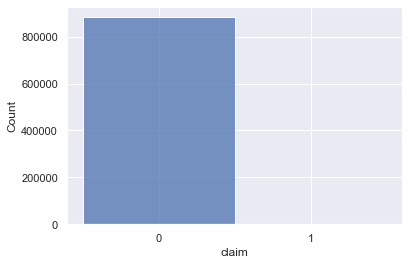

In [72]:
import seaborn as sns
import matplotlib.pyplot as plt
# set a grey background (use sns.set_theme() if seaborn version 0.11.0 or above) 
sns.set(style="darkgrid")

sns.histplot(df['claim'])
plt.show()

In [78]:
df['claim'].value_counts()

0    882575
1      1832
Name: claim, dtype: int64

In [80]:
df['claim'].value_counts(normalize=True)

0    0.997929
1    0.002071
Name: claim, dtype: float64

In [81]:
df['claim'].value_counts()[0]/df['claim'].value_counts()[1]

481.7549126637555

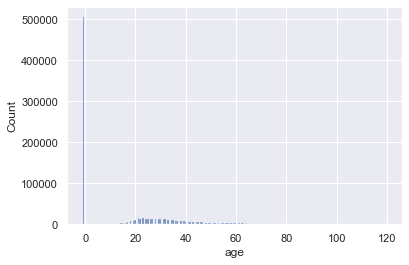

In [82]:
import seaborn as sns
import matplotlib.pyplot as plt
# set a grey background (use sns.set_theme() if seaborn version 0.11.0 or above) 
sns.set(style="darkgrid")

sns.histplot(df['age'])
plt.show()

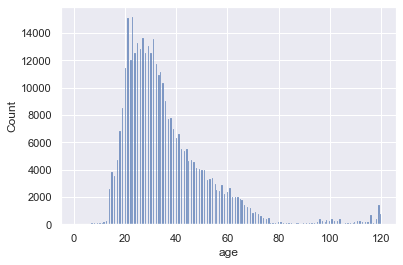

In [71]:
import seaborn as sns
import matplotlib.pyplot as plt
# set a grey background (use sns.set_theme() if seaborn version 0.11.0 or above) 
sns.set(style="darkgrid")

sns.histplot(df[df['age'] > 0]['age'])
plt.show()

In [83]:
df.sample(1)

,session_id,claim,60sec,scroll_90,hit_date,referer_url,url,utm_source,utm_medium,gender,age,touch_screen,has_vk_id,has_ok_id
843212,2d4de0b8b8d65320,0,False,False,2021-12-04,https://gb.ru/profportal/personal,https://gb.ru/,NaN,NaN,0,31,1,True,False


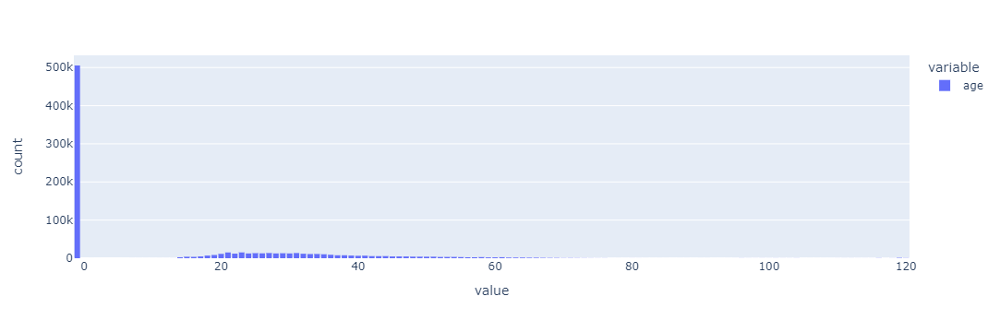

In [38]:
import plotly.express as px

fig = px.histogram(df["age"])
fig.update_layout(bargap=0.2)
fig.show()

In [84]:
df['hit_date'].min()

Timestamp('2021-12-01 00:00:00')

In [86]:
df['hit_date'].max()

Timestamp('2021-12-04 00:00:00')

In [87]:
df['hit_date'].value_counts()

2021-12-02    250158
2021-12-01    227725
2021-12-04    211636
2021-12-03    194888
Name: hit_date, dtype: int64

## 3. Статистический анализ данных

In [88]:
df[df['age'] > 0].groupby("touch_screen")['age'].mean()

touch_screen
1    34.226886
2    39.473903
Name: age, dtype: float64

In [43]:
df['age'].quantile()

-1.0

In [44]:
x = any(['https://gb.ru/ ', 'https://gb.ru/education', 'https://www.google.com/ ', 'https://gb.ru/login'])
x

True

In [45]:
len(df[df['referer_url'] == 'https://gb.ru/ '])

0

In [97]:
df[df['age'] > 0].groupby(['claim', 'touch_screen'])['age'].agg(['median', 'mean'])#.reset_index()

median       mean
claim touch_screen                   
0     1               30.0  34.228438
      2               36.0  39.478778
1     1               28.0  32.215385
      2               29.0  33.567308

## 4. Предобработка данных (обработка пропусков, аномалий)

Как можно заполнять пропуски в pandas: https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.fillna.html

In [98]:
df['age'].fillna(df['age'].median)

0         39
1         -1
2         49
3         -1
4         23
          ..
884402    -1
884403    22
884404    39
884405    -1
884406    -1
Name: age, Length: 884407, dtype: int64

## 5. Построение воронки клиентов

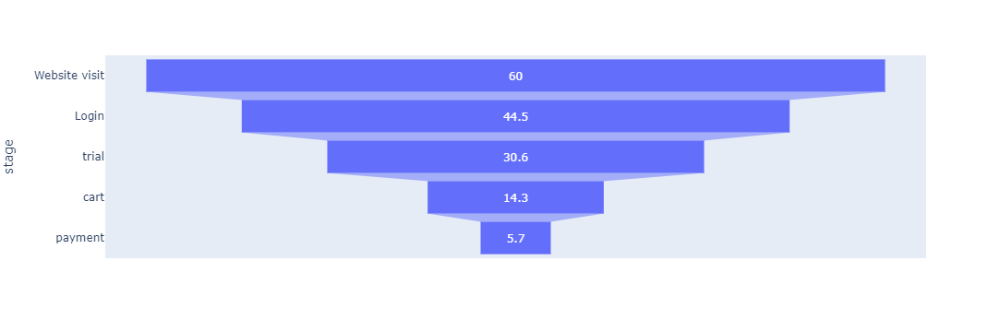

In [99]:
import plotly.express as px
data = dict(
    number=[60, 44.5, 30.6, 14.3, 5.7],
    stage=["Website visit", "Login", "trial", "cart", "payment"])
fig = px.funnel(data, x='number', y='stage')
fig.show()

Построение воронки клиентов: https://plotly.com/python/funnel-charts/

In [26]:
#df['event_month'] = df['hit_date'].astype('datetime64[M]')
#df['event_week']  = df['hit_date'].astype('datetime64[W]')
df['event_date']  = df['hit_date'].dt.date

In [28]:
dau = df.groupby('event_date').agg({'session_id': 'nunique'})

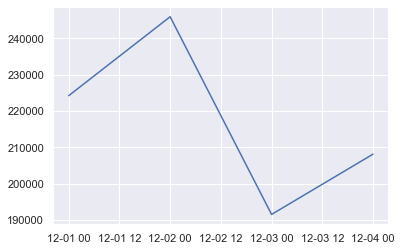

In [31]:
plt.plot(dau);

In [32]:
df['hit_date']

0        2021-12-01
1        2021-12-01
2        2021-12-01
3        2021-12-01
4        2021-12-01
            ...    
884402   2021-12-04
884403   2021-12-04
884404   2021-12-04
884405   2021-12-04
884406   2021-12-04
Name: hit_date, Length: 884407, dtype: datetime64[ns]